In [5]:
# Imports and PyTorch settings
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam
from torch.utils.data import DataLoader
import torchvision
from torchvision import transforms

import numpy as np
import matplotlib.pyplot as plt
import PIL
from PIL import Image
import math
import time
import os

from inspect import isfunction
from tqdm.auto import tqdm
from einops import rearrange
from inspect import isfunction
from functools import partial

# Global variables
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

T = 200
DATASET_FOLDER = './downloadedskins'
IMAGE_SIZE = 64
CHANNELS = 4
IMAGE_SHAPE = (IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
BATCH_SIZE = 64
MODEL_NAME = 'Ivan_Shishkin'
LEARNING_RATE = 1e-4

# torch.manual_seed(0) # Potentally use for reproducibility
# np.random.seed(0)    # ^
torch.backends.cudnn.benchmark = True
torch.backends.cudnn.enabled = True

cuda:0


# Dataset Things

In [6]:
# Schedulers

def cosine_beta_schedule(timesteps, s=0.008):
    """
    cosine schedule as proposed in https://arxiv.org/abs/2102.09672
    """
    steps = timesteps + 1
    x = torch.linspace(0, timesteps, steps)
    alphas_cumprod = torch.cos(((x / timesteps) + s) / (1 + s) * torch.pi * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0.0001, 0.9999)

def linear_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return torch.linspace(beta_start, beta_end, timesteps)

def quadratic_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return torch.linspace(beta_start**0.5, beta_end**0.5, timesteps) ** 2

def sigmoid_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    betas = torch.linspace(-6, 6, timesteps)
    return torch.sigmoid(betas) * (beta_end - beta_start) + beta_start

def get_index_from_list(vals, t, x_shape):
    """ 
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

@torch.no_grad()
def forward_diffusion_sample(x_0, t):
    """ 
    Takes an image and a timestep as input and 
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0) # sample noise from standard normal distribution

    # print("x_0.shape: ", x_0.shape)
    # print("noise.shape: ", noise.shape)
    # print("t.shape: ", t)
        
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x_0.shape)

    # mean + variance
    final_image = sqrt_alphas_cumprod_t.to(device) * x_0.to(device) + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device)
    final_image = torch.clamp(final_image, -1., 1.)
    
    return final_image, noise.to(device)

    


# Define beta schedule
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

In [7]:
transform = transforms.Compose([
    transforms.Lambda(lambda img: img.convert("RGBA")),
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    
    transforms.Lambda(lambda t: t * 2. - 1.),  # Normalize to [-1, 1]
])

def round_alpha_channel(t):
    t[3] = torch.round(t[3] * 255) / 255
    return t

reverse_transform = transforms.Compose([
    transforms.Lambda(lambda t: (t + 1) / 2),
    # transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
    transforms.Lambda(lambda t: t * 255.),
    # transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
    transforms.ToPILImage(),
])

def load_transformed_dataset():
    dataset = torchvision.datasets.ImageFolder(root=DATASET_FOLDER, transform=transform)
    return dataset

def show_tensor_image(image):
    plt.imshow(reverse_transform(image))

data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

print(data[0][0])

tensor([[[-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
         [-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
         [-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
         ...,
         [-1.0000, -1.0000, -1.0000,  ...,  0.7020, -1.0000, -1.0000],
         [-1.0000, -1.0000, -1.0000,  ...,  0.8039, -1.0000, -1.0000],
         [-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000]],

        [[-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
         [-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
         [-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
         ...,
         [-1.0000, -1.0000, -1.0000,  ...,  0.7020, -1.0000, -1.0000],
         [-1.0000, -1.0000, -1.0000,  ...,  0.8039, -1.0000, -1.0000],
         [-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000]],

        [[-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
         [-1.0000, -1.0000, -1.0000,  ..., -1

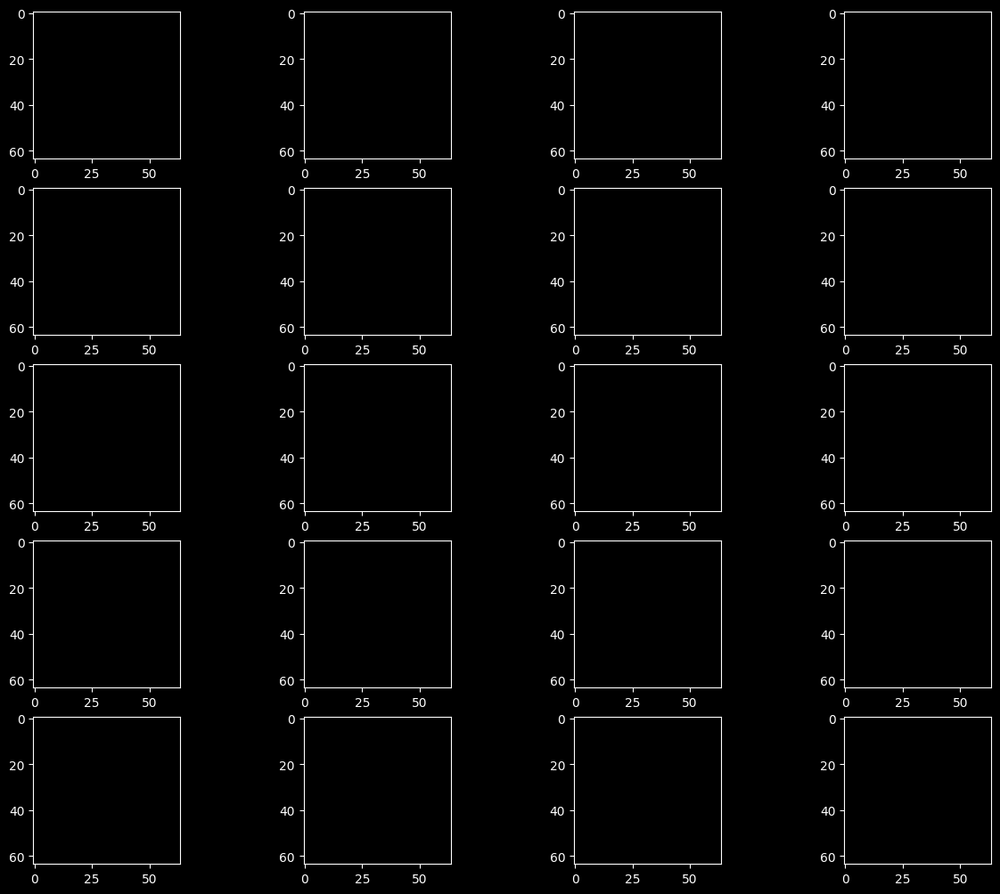

In [8]:
def show_images(dataset, num_samples=20, cols=4):
    """ Plots some samples from the dataset """
    plt.figure(figsize=(15,15)) 
    for i, img in enumerate(dataset):
        if i == num_samples:
            break
        plt.subplot(int(num_samples/cols) + 1, cols, i + 1)
        show_tensor_image(img[0])

# Show some images
show_images(data)

# Model Things

In [9]:
# Common functions

def exists(x):
    return x is not None

def default(val, d):
    if exists(val):
        return val
    return d() if isfunction(d) else d

class Residual(nn.Module):
    def __init__(self, fn):
        super().__init__()
        self.fn = fn

    def forward(self, x, *args, **kwargs):
        return self.fn(x, *args, **kwargs) + x

def Upsample(dim):
    return nn.ConvTranspose2d(dim, dim, 4, 2, 1)

def Downsample(dim):
    return nn.Conv2d(dim, dim, 4, 2, 1)

In [10]:
# Positional embeddings

class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings
    
# Diffusion Blocks

class Block(nn.Module):
    def __init__(self, dim, dim_out, groups = 8):
        super().__init__()
        self.proj = nn.Conv2d(dim, dim_out, 3, padding = 1)
        self.norm = nn.GroupNorm(groups, dim_out)
        self.act = nn.SiLU()

    def forward(self, x, scale_shift = None):
        x = self.proj(x)
        x = self.norm(x)

        if exists(scale_shift):
            scale, shift = scale_shift
            x = x * (scale + 1) + shift

        x = self.act(x)
        return x

class ResnetBlock(nn.Module):
    """https://arxiv.org/abs/1512.03385"""
    
    def __init__(self, dim, dim_out, *, time_emb_dim=None, groups=8):
        super().__init__()
        self.mlp = (
            nn.Sequential(nn.SiLU(), nn.Linear(time_emb_dim, dim_out))
            if exists(time_emb_dim)
            else None
        )

        self.block1 = Block(dim, dim_out, groups=groups)
        self.block2 = Block(dim_out, dim_out, groups=groups)
        self.res_conv = nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()

    def forward(self, x, time_emb=None):
        h = self.block1(x)

        if exists(self.mlp) and exists(time_emb):
            time_emb = self.mlp(time_emb)
            h = rearrange(time_emb, "b c -> b c 1 1") + h

        h = self.block2(h)
        return h + self.res_conv(x)
    
class ConvNextBlock(nn.Module):
    """https://arxiv.org/abs/2201.03545"""

    def __init__(self, dim, dim_out, *, time_emb_dim=None, mult=2, norm=True):
        super().__init__()
        self.mlp = (
            nn.Sequential(nn.GELU(), nn.Linear(time_emb_dim, dim))
            if exists(time_emb_dim)
            else None
        )

        self.ds_conv = nn.Conv2d(dim, dim, 7, padding=3, groups=dim)

        self.net = nn.Sequential(
            nn.GroupNorm(1, dim) if norm else nn.Identity(),
            nn.Conv2d(dim, dim_out * mult, 3, padding=1),
            nn.GELU(),
            nn.GroupNorm(1, dim_out * mult),
            nn.Conv2d(dim_out * mult, dim_out, 3, padding=1),
        )

        self.res_conv = nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()

    def forward(self, x, time_emb=None):
        h = self.ds_conv(x)

        if exists(self.mlp) and exists(time_emb):
            assert exists(time_emb), "time embedding must be passed in"
            condition = self.mlp(time_emb)
            h = h + rearrange(condition, "b c -> b c 1 1")

        h = self.net(h)
        return h + self.res_conv(x)
    
# Attention Blocks

class Attention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32):
        super().__init__()
        self.scale = dim_head**-0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)
        self.to_out = nn.Conv2d(hidden_dim, dim, 1)

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=1)
        q, k, v = map(
            lambda t: rearrange(t, "b (h c) x y -> b h c (x y)", h=self.heads), qkv
        )
        q = q * self.scale

        sim = torch.einsum("b h d i, b h d j -> b h i j", q, k)
        sim = sim - sim.amax(dim=-1, keepdim=True).detach()
        attn = sim.softmax(dim=-1)

        out = torch.einsum("b h i j, b h d j -> b h i d", attn, v)
        out = rearrange(out, "b h (x y) d -> b (h d) x y", x=h, y=w)
        return self.to_out(out)

class LinearAttention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32):
        super().__init__()
        self.scale = dim_head**-0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)

        self.to_out = nn.Sequential(nn.Conv2d(hidden_dim, dim, 1), 
                                    nn.GroupNorm(1, dim))

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=1)
        q, k, v = map(
            lambda t: rearrange(t, "b (h c) x y -> b h c (x y)", h=self.heads), qkv
        )

        q = q.softmax(dim=-2)
        k = k.softmax(dim=-1)

        q = q * self.scale
        context = torch.einsum("b h d n, b h e n -> b h d e", k, v)

        out = torch.einsum("b h d e, b h d n -> b h e n", context, q)
        out = rearrange(out, "b h c (x y) -> b (h c) x y", h=self.heads, x=h, y=w)
        return self.to_out(out)

In [11]:
# Normalization

class PreNorm(nn.Module):
    def __init__(self, dim, fn):
        super().__init__()
        self.fn = fn
        self.norm = nn.GroupNorm(1, dim)

    def forward(self, x):
        x = self.norm(x)
        return self.fn(x)

In [12]:
# Unet Model

class Unet(nn.Module):
    def __init__(
        self,
        dim,
        init_dim=None,
        out_dim=4,
        dim_mults=(1, 2, 4, 8),
        channels=4,
        with_time_emb=True,
        resnet_block_groups=8,
        use_convnext=True,
        convnext_mult=2,
    ):
        super().__init__()

        # determine dimensions
        self.channels = channels

        init_dim = default(init_dim, dim // 3 * 2)
        self.init_conv = nn.Conv2d(channels, init_dim, 7, padding=3)

        dims = [init_dim, *map(lambda m: dim * m, dim_mults)]
        in_out = list(zip(dims[:-1], dims[1:]))
        
        if use_convnext:
            block_klass = partial(ConvNextBlock, mult=convnext_mult)
        else:
            block_klass = partial(ResnetBlock, groups=resnet_block_groups)

        # time embeddings
        if with_time_emb:
            time_dim = dim * 4
            self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(dim),
                nn.Linear(dim, time_dim),
                nn.GELU(),
                nn.Linear(time_dim, time_dim),
            )
        else:
            time_dim = None
            self.time_mlp = None

        # layers
        self.downs = nn.ModuleList([])
        self.ups = nn.ModuleList([])
        num_resolutions = len(in_out)

        for ind, (dim_in, dim_out) in enumerate(in_out):
            is_last = ind >= (num_resolutions - 1)

            self.downs.append(
                nn.ModuleList(
                    [
                        block_klass(dim_in, dim_out, time_emb_dim=time_dim),
                        block_klass(dim_out, dim_out, time_emb_dim=time_dim),
                        Residual(PreNorm(dim_out, LinearAttention(dim_out))),
                        Downsample(dim_out) if not is_last else nn.Identity(),
                    ]
                )
            )

        mid_dim = dims[-1]
        self.mid_block1 = block_klass(mid_dim, mid_dim, time_emb_dim=time_dim)
        self.mid_attn = Residual(PreNorm(mid_dim, Attention(mid_dim)))
        self.mid_block2 = block_klass(mid_dim, mid_dim, time_emb_dim=time_dim)

        for ind, (dim_in, dim_out) in enumerate(reversed(in_out[1:])):
            is_last = ind >= (num_resolutions - 1)

            self.ups.append(
                nn.ModuleList(
                    [
                        block_klass(dim_out * 2, dim_in, time_emb_dim=time_dim),
                        block_klass(dim_in, dim_in, time_emb_dim=time_dim),
                        Residual(PreNorm(dim_in, LinearAttention(dim_in))),
                        Upsample(dim_in) if not is_last else nn.Identity(),
                    ]
                )
            )

        out_dim = default(out_dim, channels)
        self.final_conv = nn.Sequential(
            block_klass(dim, dim), nn.Conv2d(dim, out_dim, 1)
        )

    def forward(self, x, time):
        x = self.init_conv(x)

        t = self.time_mlp(time) if exists(self.time_mlp) else None

        h = []

        # downsample
        for block1, block2, attn, downsample in self.downs:
            x = block1(x, t)
            x = block2(x, t)
            x = attn(x)
            h.append(x)
            x = downsample(x)

        # bottleneck
        x = self.mid_block1(x, t)
        x = self.mid_attn(x)
        x = self.mid_block2(x, t)

        # upsample
        for block1, block2, attn, upsample in self.ups:
            x = torch.cat((x, h.pop()), dim=1)
            x = block1(x, t)
            x = block2(x, t)
            x = attn(x)
            x = upsample(x)

        return self.final_conv(x)

In [13]:
# Loss functions

def get_loss(denoise_model, x_start, t):
    # plt.figure(figsize=(15,15))
    x_noisy, noise = forward_diffusion_sample(x_start, t)
    # plt.subplot(1,4,1)
    # show_tensor_image(x_noisy[0])
    # plt.subplot(1,4,2)
    # show_tensor_image(noise[0])
    predicted_noise = denoise_model(x_noisy, t)
    # plt.subplot(1,4,3)
    # show_tensor_image(predicted_noise[0])
    # plt.subplot(1,4,4)
    # show_tensor_image(x_noisy[0] - predicted_noise[0])
    loss = F.l1_loss(noise, predicted_noise)
    return loss

In [14]:
# Create Model

model = Unet(
    dim=IMAGE_SIZE,
    channels=CHANNELS,
    dim_mults=(1, 2, 4, 8)
)
model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)


# Noise Things

image.shape:  torch.Size([4, 64, 64])


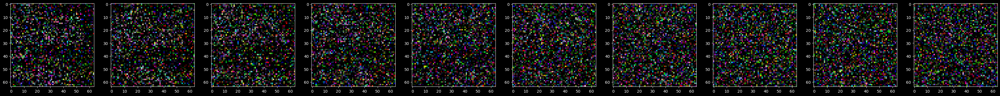

In [15]:
# Simulate Forward Diffusion
image = next(iter(dataloader))[0][0]
print("image.shape: ", image.shape)

plt.figure(figsize=(50,50))
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    img, noise = forward_diffusion_sample(image, t)
    show_tensor_image(img)

plt.show()

In [16]:
# Noise Functions

@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns 
    the denoised image. 
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    
    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
    
    if t == 0:
        # As pointed out by Luis Pereira (see YouTube comment)
        # The t's are offset from the t's in the paper
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

@torch.no_grad()
def sample_plot_image(num_images=10):
    # Sample noise
    img_size = IMAGE_SIZE
    img = torch.randn((1, 4, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        # Edit: This is to maintain the natural range of the distribution
        img = torch.clamp(img, -1.0, 1.0)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu()[0])
    plt.show()

@torch.no_grad()
def generate_single_image():
    img = torch.randn((1, 4, IMAGE_SIZE, IMAGE_SIZE), device=device)
    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        img = torch.clamp(img, -1.0, 1.0)
    return img

# Training

In [17]:
# Load model if it exists
# if os.path.exists(MODEL_PATH):
#     model.load_state_dict(torch.load(MODEL_PATH))
#     print("Loaded model from: ", MODEL_PATH)

C:\Users\Aidan\AppData\Local\Temp\ipykernel_1996\1392934117.py:45: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images, int(i/stepsize)+1)


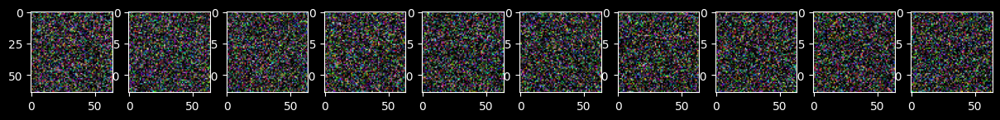

In [18]:
sample_plot_image()

Using device: cuda:0


Epochs:   0%|          | 0/1000 [00:00<?, ?it/s]

Starting Training Loop...
Beginning epoch 0


Epoch 0 | Loss: 0.3075 | Step: 1503/1504: 100%|==========| 96256/96256 [11:21<00:00, 141.21it/s]
C:\Users\Aidan\AppData\Local\Temp\ipykernel_1996\1392934117.py:45: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images, int(i/stepsize)+1)


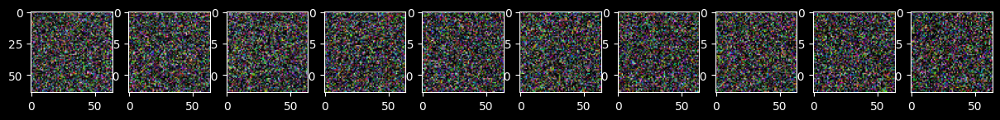

Epochs:   0%|          | 2/1000 [11:25<95:01:34, 342.78s/it]

Beginning epoch 1


Epoch 1 | Loss: 0.2688 | Step: 1503/1504: 100%|==========| 96256/96256 [11:13<00:00, 142.91it/s]


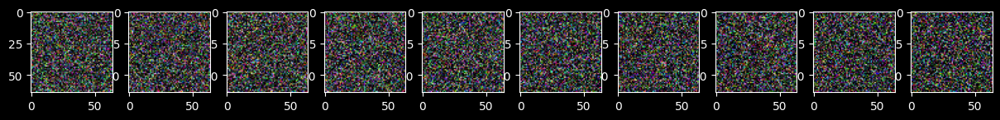

Epochs:   0%|          | 3/1000 [22:42<133:29:59, 482.05s/it]

Beginning epoch 2


Epoch 2 | Loss: 0.2617 | Step: 1503/1504: 100%|==========| 96256/96256 [11:18<00:00, 141.89it/s]


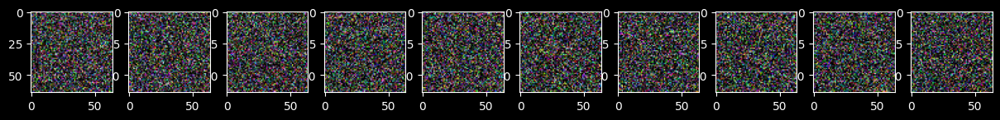

Epochs:   0%|          | 4/1000 [34:04<153:59:20, 556.59s/it]

Beginning epoch 3


Epoch 3 | Loss: 0.2452 | Step: 1503/1504: 100%|==========| 96256/96256 [11:17<00:00, 142.09it/s]


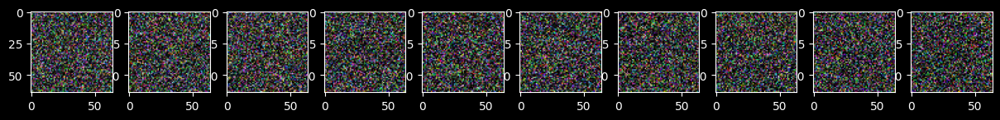

Epochs:   0%|          | 5/1000 [45:25<165:46:56, 599.82s/it]

Beginning epoch 4


Epoch 4 | Loss: 0.2338 | Step: 1503/1504: 100%|==========| 96256/96256 [11:16<00:00, 142.19it/s]


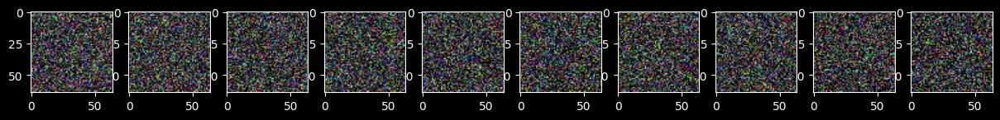

Epochs:   1%|          | 6/1000 [56:45<173:00:39, 626.60s/it]

Beginning epoch 5


Epoch 5 | Loss: 0.2446 | Step: 1503/1504: 100%|==========| 96256/96256 [10:20<00:00, 155.11it/s]


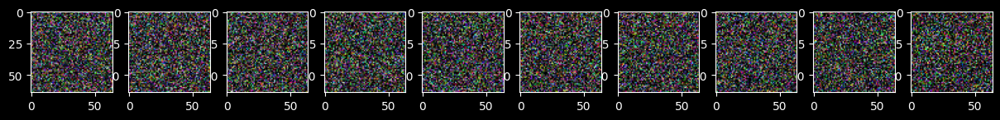

Epochs:   1%|          | 7/1000 [1:07:09<172:35:04, 625.68s/it]

Beginning epoch 6


Epoch 6 | Loss: 0.2247 | Step: 1503/1504: 100%|==========| 96256/96256 [10:01<00:00, 160.02it/s]


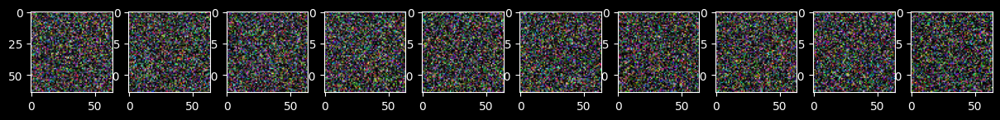

Epochs:   1%|          | 8/1000 [1:17:14<170:35:36, 619.09s/it]

Beginning epoch 7


Epoch 7 | Loss: 0.2200 | Step: 1503/1504: 100%|==========| 96256/96256 [10:00<00:00, 160.36it/s]


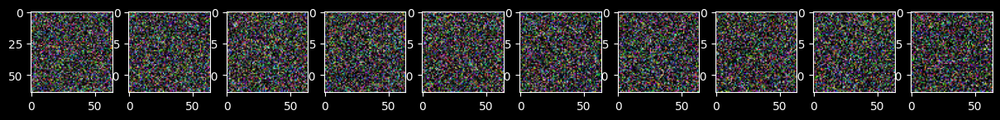

Epochs:   1%|          | 9/1000 [1:27:17<169:05:31, 614.26s/it]

Beginning epoch 8


Epoch 8 | Loss: 0.2064 | Step: 1503/1504: 100%|==========| 96256/96256 [09:59<00:00, 160.53it/s]


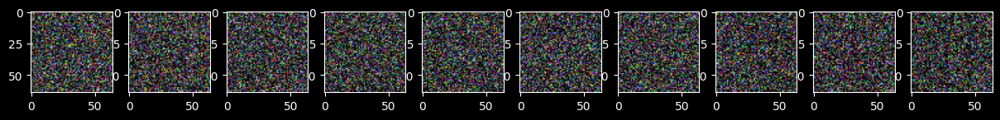

Epochs:   1%|          | 10/1000 [1:37:20<167:57:47, 610.77s/it]

Beginning epoch 9


Epoch 9 | Loss: 0.2355 | Step: 1503/1504: 100%|==========| 96256/96256 [09:59<00:00, 160.46it/s]


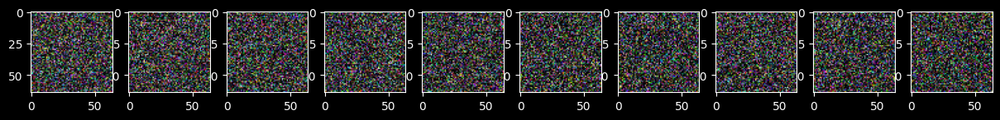

Epochs:   1%|          | 11/1000 [1:47:23<167:09:20, 608.45s/it]

Beginning epoch 10


Epoch 10 | Loss: 0.2059 | Step: 1503/1504: 100%|==========| 96256/96256 [09:59<00:00, 160.50it/s]


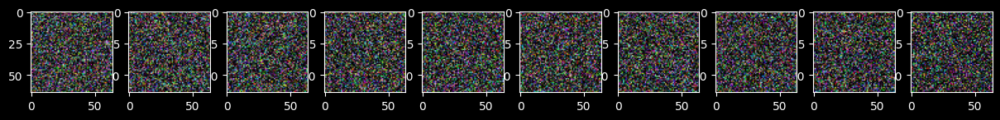

Epochs:   1%|          | 12/1000 [1:57:27<166:33:42, 606.91s/it]

Beginning epoch 11


Epoch 11 | Loss: 0.2204 | Step: 1503/1504: 100%|==========| 96256/96256 [10:00<00:00, 160.22it/s]


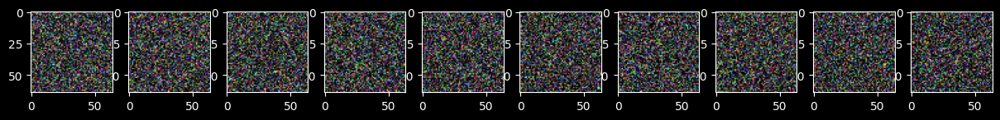

Epochs:   1%|▏         | 13/1000 [2:07:31<166:09:24, 606.04s/it]

Beginning epoch 12


Epoch 12 | Loss: 0.2267 | Step: 1503/1504: 100%|==========| 96256/96256 [10:01<00:00, 160.15it/s]


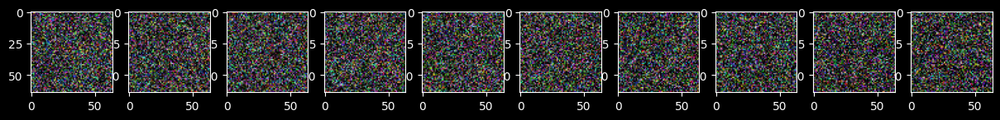

Epochs:   1%|▏         | 14/1000 [2:17:35<165:50:53, 605.53s/it]

Beginning epoch 13


Epoch 13 | Loss: 0.2146 | Step: 1503/1504: 100%|==========| 96256/96256 [10:00<00:00, 160.22it/s]


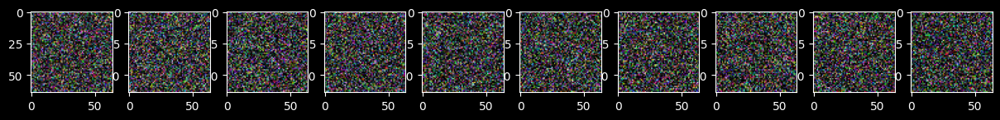

Epochs:   2%|▏         | 15/1000 [2:27:39<165:33:06, 605.06s/it]

Beginning epoch 14


Epoch 14 | Loss: 0.2122 | Step: 1503/1504: 100%|==========| 96256/96256 [10:03<00:00, 159.49it/s]


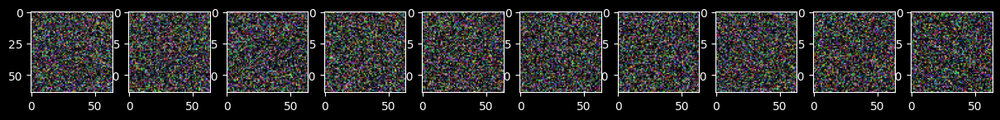

Epochs:   2%|▏         | 16/1000 [2:37:46<165:31:14, 605.56s/it]

Beginning epoch 15


Epoch 15 | Loss: 0.2147 | Step: 1503/1504: 100%|==========| 96256/96256 [09:50<00:00, 163.02it/s]


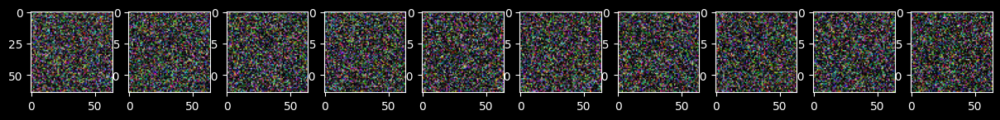

Epochs:   2%|▏         | 17/1000 [2:47:40<164:23:34, 602.05s/it]

Beginning epoch 16


Epoch 16 | Loss: 0.2131 | Step: 1503/1504: 100%|==========| 96256/96256 [09:46<00:00, 164.16it/s]


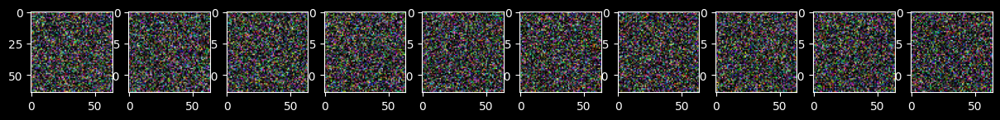

Epochs:   2%|▏         | 18/1000 [2:57:29<163:12:34, 598.32s/it]

Beginning epoch 17


Epoch 17 | Loss: 0.2075 | Step: 1503/1504: 100%|==========| 96256/96256 [09:47<00:00, 163.90it/s]


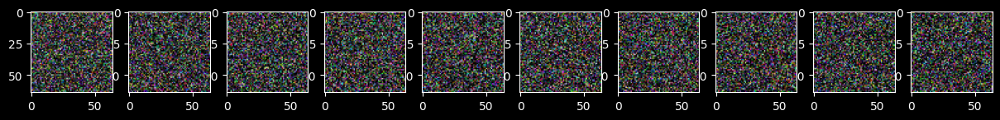

Epochs:   2%|▏         | 19/1000 [3:07:20<162:24:27, 595.99s/it]

Beginning epoch 18


Epoch 18 | Loss: 0.2213 | Step: 1503/1504: 100%|==========| 96256/96256 [09:46<00:00, 163.98it/s]


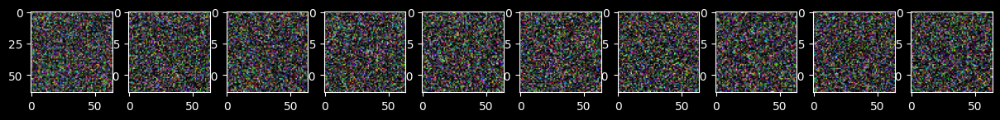

Epochs:   2%|▏         | 20/1000 [3:17:10<161:46:04, 594.25s/it]

Beginning epoch 19


Epoch 19 | Loss: 0.2084 | Step: 1503/1504: 100%|==========| 96256/96256 [09:47<00:00, 163.82it/s]


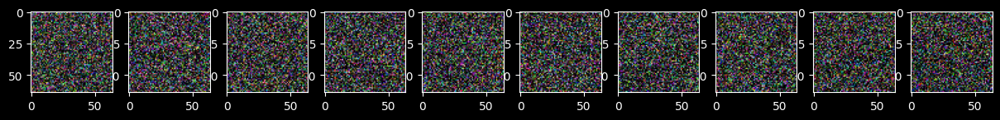

Epochs:   2%|▏         | 21/1000 [3:27:01<161:19:30, 593.23s/it]

Beginning epoch 20


Epoch 20 | Loss: 0.1981 | Step: 1503/1504: 100%|==========| 96256/96256 [09:47<00:00, 163.95it/s]


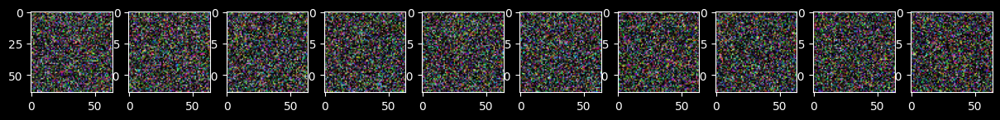

Epochs:   2%|▏         | 22/1000 [3:36:52<160:57:38, 592.49s/it]

Beginning epoch 21


Epoch 21 | Loss: 0.1967 | Step: 1503/1504: 100%|==========| 96256/96256 [09:50<00:00, 162.98it/s]


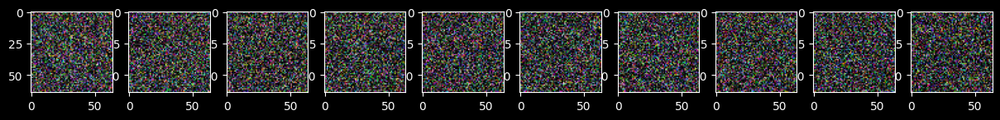

Epochs:   2%|▏         | 23/1000 [3:46:46<160:54:31, 592.91s/it]

Beginning epoch 22


Epoch 22 | Loss: 0.2149 | Step: 1503/1504: 100%|==========| 96256/96256 [09:48<00:00, 163.52it/s]


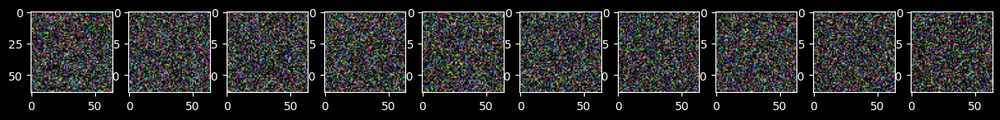

Epochs:   2%|▏         | 24/1000 [3:56:37<160:39:22, 592.58s/it]

Beginning epoch 23


Epoch 23 | Loss: 0.2136 | Step: 1503/1504: 100%|==========| 96256/96256 [09:47<00:00, 163.92it/s]


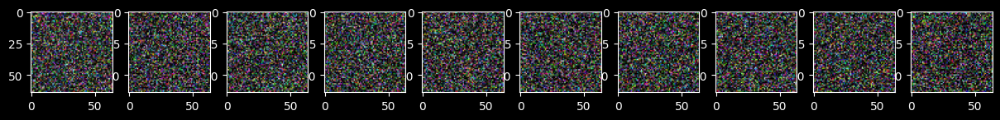

Epochs:   2%|▎         | 25/1000 [4:06:28<160:19:08, 591.95s/it]

Beginning epoch 24


Epoch 24 | Loss: 0.1925 | Step: 1503/1504: 100%|==========| 96256/96256 [09:46<00:00, 164.05it/s]


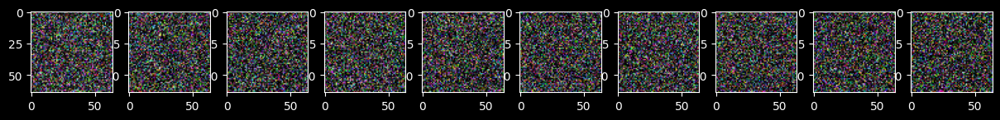

Epochs:   3%|▎         | 26/1000 [4:16:18<160:00:00, 591.38s/it]

Beginning epoch 25


Epoch 25 | Loss: 0.2016 | Step: 1503/1504: 100%|==========| 96256/96256 [09:48<00:00, 163.62it/s]


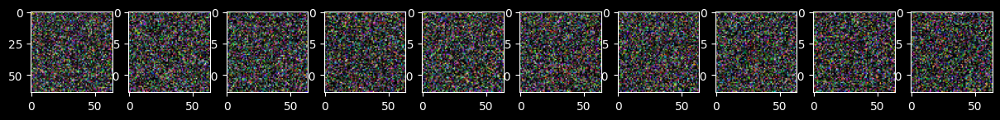

Epochs:   3%|▎         | 27/1000 [4:26:09<159:50:50, 591.42s/it]

Beginning epoch 26


Epoch 26 | Loss: 0.2037 | Step: 1503/1504: 100%|==========| 96256/96256 [09:49<00:00, 163.37it/s]


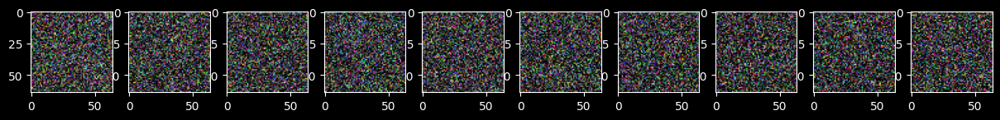

Epochs:   3%|▎         | 28/1000 [4:36:02<159:46:00, 591.73s/it]

Beginning epoch 27


Epoch 27 | Loss: 0.2079 | Step: 1503/1504: 100%|==========| 96256/96256 [10:19<00:00, 155.50it/s]


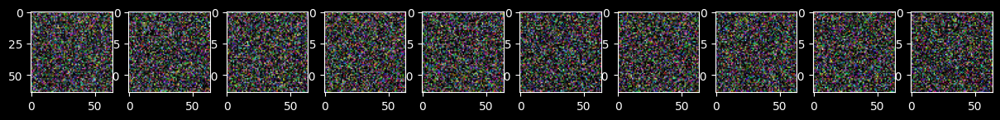

Epochs:   3%|▎         | 29/1000 [4:46:24<162:05:20, 600.95s/it]

Beginning epoch 28


Epoch 28 | Loss: 0.2085 | Step: 1503/1504: 100%|==========| 96256/96256 [10:16<00:00, 156.25it/s]


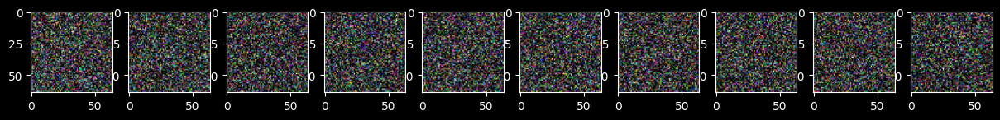

Epochs:   3%|▎         | 30/1000 [4:56:44<163:24:44, 606.48s/it]

Beginning epoch 29


Epoch 29 | Loss: 0.1913 | Step: 1141/1504:  76%|=======>  | 73088/96256 [07:48<02:41, 143.02it/s]

KeyboardInterrupt: 

Epoch 29 | Loss: 0.1913 | Step: 1141/1504:  76%|=======>  | 73088/96256 [07:59<02:41, 143.02it/s]

In [19]:
# Training

model.to(device)
print("Using device:", device)

epochs = 1000
steps = len(dataloader)

pbar_epochs = tqdm(total=epochs, desc="Epochs", leave=True, position=0)
pbar_epochs.update(0)
print("Starting Training Loop...")

for epoch in range(epochs):
    print("Beginning epoch {}".format(epoch))
    pbar_epochs.update(1)

    pbar_batches = tqdm(total=steps * BATCH_SIZE, desc=f"Epoch {epoch} | Loss: N/A", leave=True, ascii=" >=", position=0) #  ⠄⠤⠦⠶⠷⠿

    for step, batch in enumerate(dataloader):
        optimizer.zero_grad()

        t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
        loss = get_loss(model, batch[0], t)
        loss.backward()
        optimizer.step()

        pbar_batches.set_description(f"Epoch {epoch} | Loss: {loss.item():.4f} | Step: {step}/{steps}")
        pbar_batches.update(BATCH_SIZE)
    pbar_batches.close()

    # Save Generated Images
    if epoch % 10 == 0:
        torch.save(model.state_dict(), f"./complexDiffusion/{MODEL_NAME}_{epoch}.pt")
    sample_plot_image()
pbar_epochs.close()  